In [2]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import sys
sys.path.append('../')

from fastai import *
from fastai.vision import *
from fastai.callbacks import *
from data.load import get_data, subsample
from model.metrics import psnr, ssim
from model import losses, learners

## Choose Devices

In [3]:
gpu_id = 3
num_cores = 4

In [4]:
torch.cuda.set_device(gpu_id)

To load the patch critic, loading data is necessary. Is there a way to load the model without loading any data (can we save a good critic not as .pth file but as something else)?

## Resnet Feature loss

### Load critic model

In [5]:
data_pth = Path('/home/alaa/Dropbox/BPHO Staff/USF')  # path to dataset
critic_path = data_pth/f'EM/models/critics'  # path to saved models
critic_name = 'critic-patches-unet-simplev2.1g'

In [6]:
critic = load_learner(critic_path, critic_name)

In [7]:
critic.model;

### Define the feature loss class

In [8]:
encoder = critic.model.eval()[0]
layers, prev_layer_idxs = losses.grab_resnet_layers(encoder)
layers, prev_layer_idxs

([Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False),
  Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False),
  Conv2d(64, 128, kernel_size=(1, 1), stride=(2, 2), bias=False),
  Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False),
  Conv2d(128, 256, kernel_size=(1, 1), stride=(2, 2), bias=False),
  Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False),
  Conv2d(256, 512, kernel_size=(1, 1), stride=(2, 2), bias=False)],
 [[4, -1, -1],
  [5, 0, 4, -1],
  [5, -1, -1],
  [6, 0, 4, -1],
  [6, -1, -1],
  [7, 0, 4, -1]])

In [9]:
del(critic)

In [10]:
feat_loss = losses.FeatureLoss(m_feat=encoder, layer_ids=prev_layer_idxs, 
                               layer_wgts=[1/6 for _ in range(6)])

# Model

## Initialization

In [11]:
nb_name = 'featureloss-resnet34-pretrained-simplecritic'
data_pth = Path('/home/alaa/Dropbox/BPHO Staff/USF/')
lr_path = f'EM/training/trainsets/lr/'
hr_path = f'EM/training/trainsets/hr/'
model_path = data_pth/f'EM/models/feat_loss/'

# loading 3 rounds of data
bs_1 = 64
size_1 = 128
db = get_data(data_pth=data_pth, lr_dir=lr_path, hr_dir=hr_path,
             bs=bs_1, in_sz=size_1, out_sz=size_1, max_zoom=6)

In [12]:
# subsample 
db = subsample(db, seed=42)

In [13]:
# ONLY USE FOR MODEL LOADING
bs_1 = 8
size_1 = 512
db = get_data(data_pth=data_pth, lr_dir=lr_path, hr_dir=hr_path,
             bs=bs_1, in_sz=size_1, out_sz=size_1, max_zoom=2.)

In [14]:
superres_metrics = [F.mse_loss, psnr, ssim]

In [15]:
arch = models.resnet34
wd = 1e-3
learn = unet_learner(db, arch, wd=wd, 
                         loss_func=feat_loss,
                         metrics=superres_metrics, 
                         #callback_fns=LossMetrics, 
                         blur=False, 
                         norm_type=NormType.Weight, 
                         model_dir=model_path)
gc.collect()

0

In [16]:
learn.model_dir = model_path
print(learn.model_dir)

/home/alaa/Dropbox/BPHO Staff/USF/EM/models/feat_loss


## Load Model (optional)

In [17]:
# learn.model_dir = model_pth
learn = learn.load(f'{nb_name}.3c')
# load pssr model
# learn = learn.load('emsynth_005_unet.5')

## Training

In [19]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


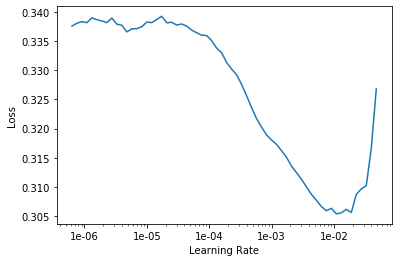

In [20]:
learn.recorder.plot()

### 1a

In [28]:
lr = 3e-4
learn.fit_one_cycle(1, max_lr=lr)
learn.save(f'{nb_name}.1a', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.251648,0.219881,0.040363,22.317808,0.669431,01:31


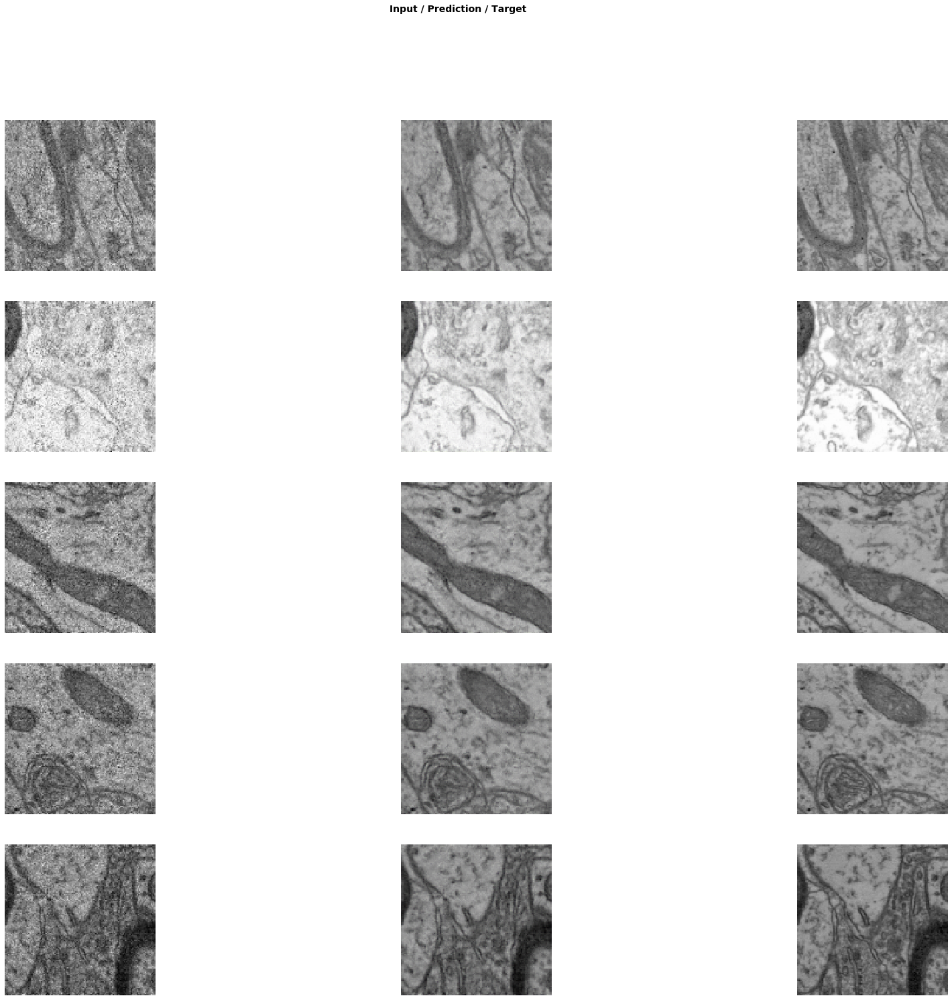

In [29]:
learn.show_results(rows=5, figsize=(30,24))

In [30]:
len(learn.data.valid_dl)

32

### 1b

In [31]:
learn.unfreeze()

In [32]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


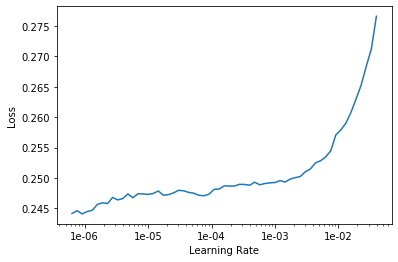

In [33]:
learn.recorder.plot()

In [34]:
lr = slice(1e-5, 1e-3)
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.1b', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.245312,0.213902,0.037320,22.657944,0.678717,01:06
1,0.242192,0.205704,0.037795,22.602777,0.682287,01:06
2,0.238969,0.205710,0.038043,22.574615,0.682154,01:03


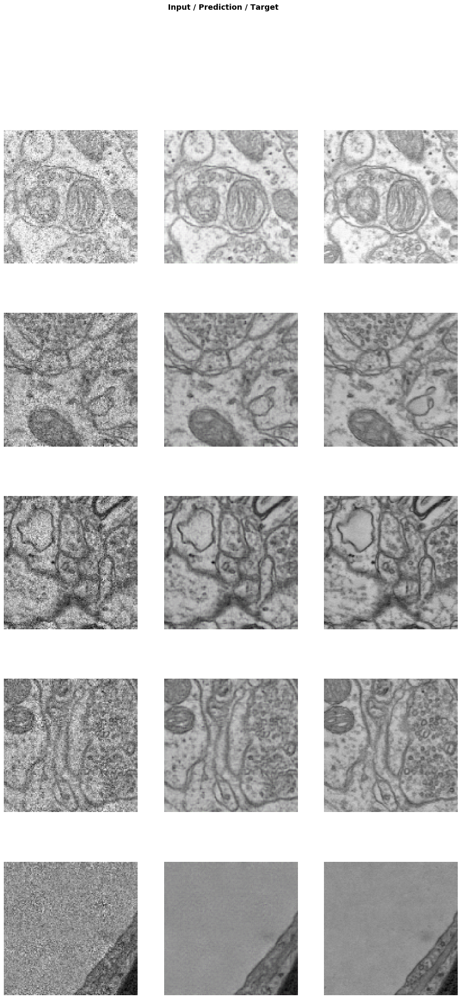

In [40]:
learn.show_results(rows=5, figsize=(15, 30))

## 2a

In [41]:
# loading 3 rounds of data
bs_2 = 32
size_2 = 256
db = get_data(data_pth=data_pth, lr_dir=lr_path, hr_dir=hr_path,
             bs=bs_2, in_sz=size_2, out_sz=size_2, max_zoom=3)

In [42]:
db = subsample(db, seed=42)

In [43]:
learn.data = db

In [46]:
learn.freeze()

In [47]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


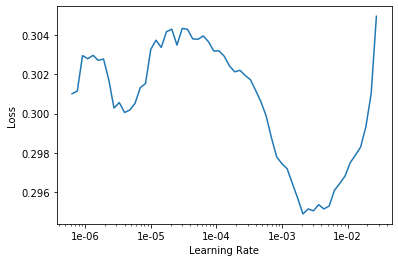

In [48]:
learn.recorder.plot()

In [49]:
lr = 5e-4
learn.fit_one_cycle(1, max_lr=lr)
learn.save(f'{nb_name}.2a', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.265610,0.230158,0.048187,21.551603,0.491338,02:44


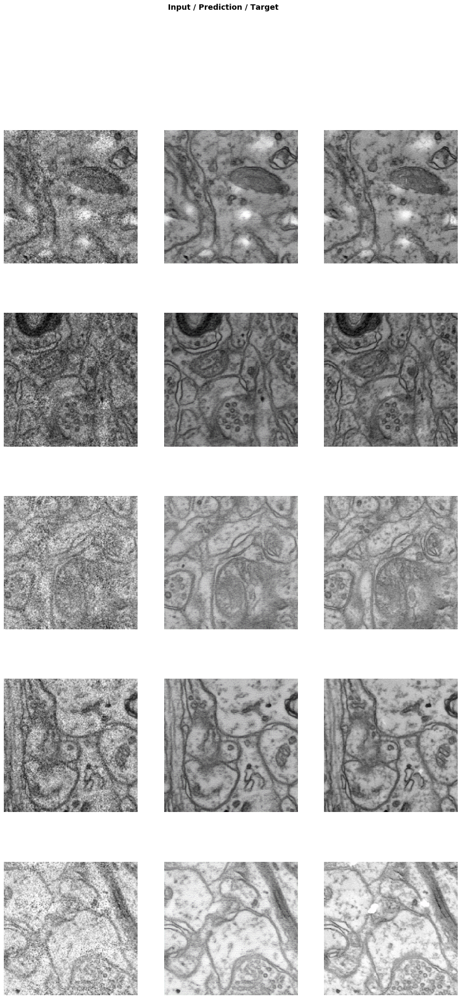

In [50]:
learn.show_results(rows=5, figsize=(15, 30))

## 2b

In [51]:
learn.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


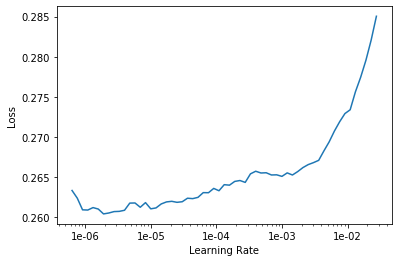

In [52]:
learn.lr_find()
learn.recorder.plot()

In [53]:
lr = slice(1e-5, 1e-3)
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.2b', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.267235,0.232640,0.048425,21.529169,0.491911,02:50
1,0.262736,0.228995,0.047386,21.624107,0.495238,02:55
2,0.260047,0.227356,0.048165,21.549950,0.495193,02:57


In [ ]:
learn.load(f'{nb_name}.2b')

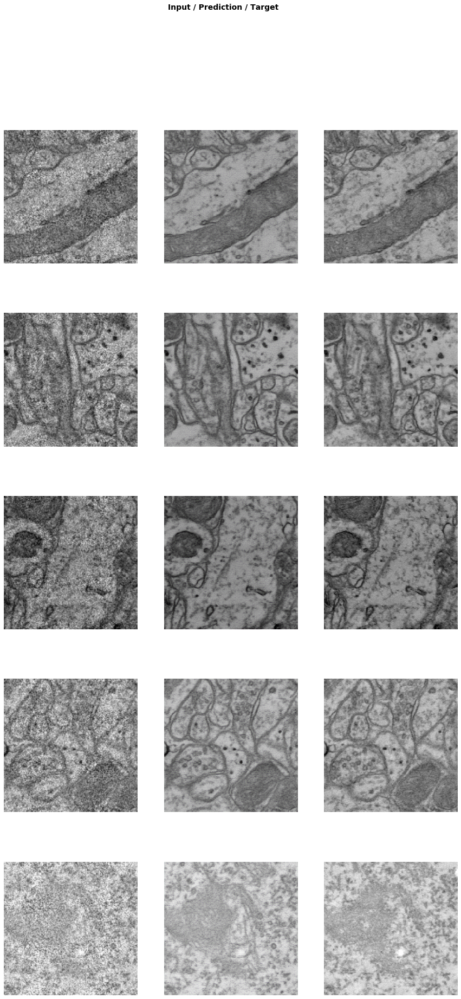

In [57]:
learn.show_results(rows=5, figsize=(15, 30))

In [18]:
# learn = learn.load(f'{nb_name}.2b');
# learn.validate()

[0.4595427, tensor(0.0450), tensor(21.8443), tensor(0.6406)]

In [20]:
# learn.load(f"emsynth_005_unet.5");
# learn.validate()

[1.6133391, tensor(0.0591), tensor(20.6605), tensor(0.4628)]

## 3a

In [19]:
# loading 3 rounds of data
bs_3 = 8
size_3 = 512
db = get_data(data_pth=data_pth, lr_dir=lr_path, hr_dir=hr_path,
             bs=bs_3, in_sz=size_3, out_sz=size_3, max_zoom=3)

In [20]:
db = subsample(db, seed=42)
learn.data = db

In [20]:
learn.freeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


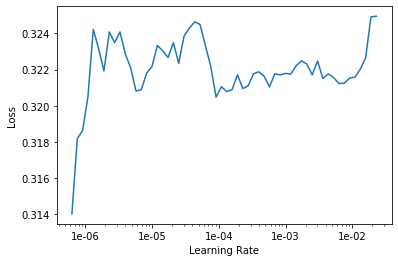

In [21]:
learn.lr_find()
learn.recorder.plot()

In [22]:
lr = 1e-3
learn.fit_one_cycle(1, max_lr=lr)
learn.save(f'{nb_name}.3a', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.286699,0.269949,0.062915,20.310274,0.273046,12:15


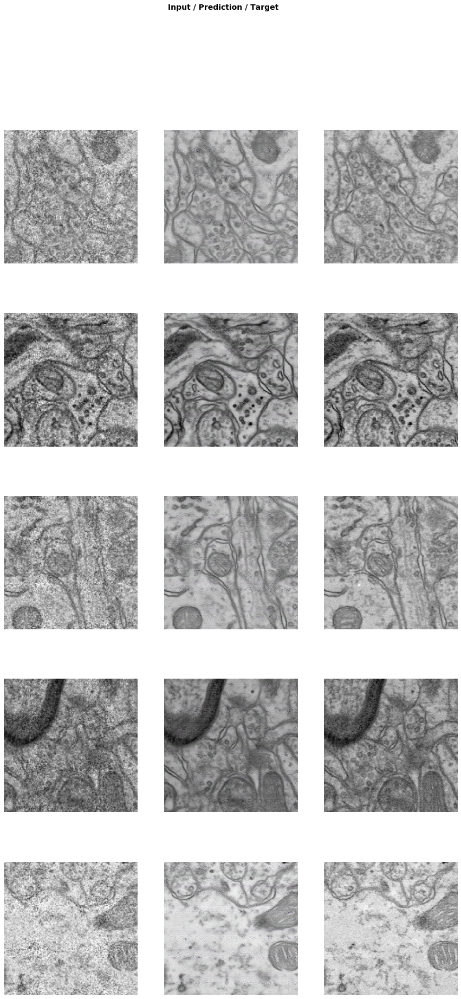

In [23]:
learn.show_results(rows=5, figsize=(15, 30))

In [24]:
learn.unfreeze()

In [25]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


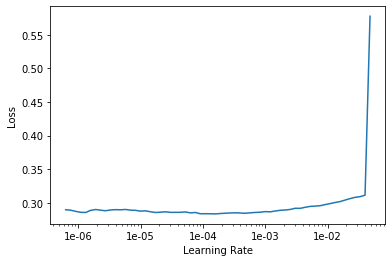

In [26]:
learn.recorder.plot()

In [ ]:
lr = slice(3e-5, 3e-4)
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.3b', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.288213,0.270356,0.064105,20.248377,0.277414,12:27
1,0.281369,0.268654,0.063632,20.275524,0.278318,12:26


In [21]:
learn.data = db

In [22]:
learn.validate()

[0.26803756, tensor(0.0625), tensor(20.3648), tensor(0.2780)]

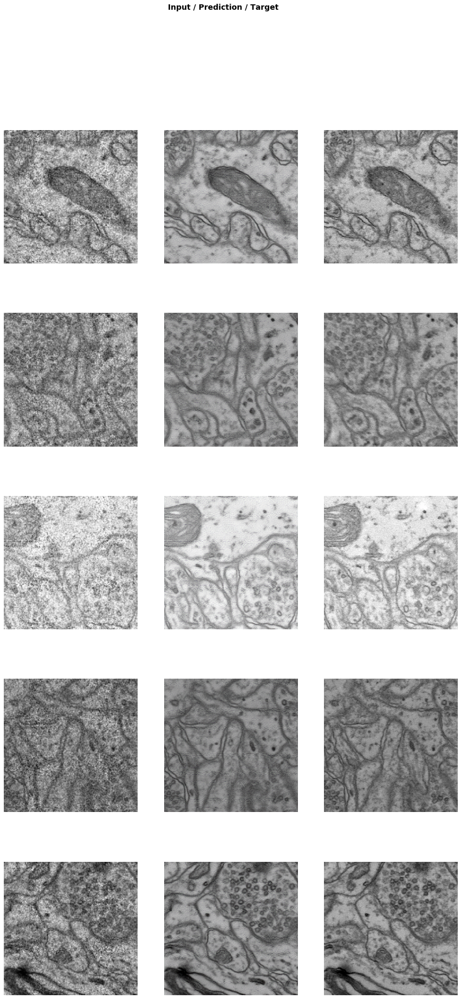

In [23]:
learn.show_results(rows=5, figsize=(15, 30))

### Visual results look good. Trying another round of training 

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


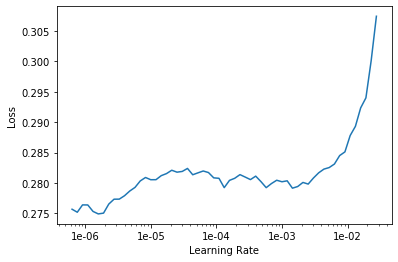

In [25]:
learn.lr_find()
learn.recorder.plot()

In [17]:
lr = slice(6e-5, 3e-4)
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.3c', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.250118,0.215610,0.039764,22.381998,0.676629,01:12
1,0.241183,0.209924,0.037631,22.616598,0.680145,01:03
2,0.240885,0.208637,0.037771,22.605896,0.680618,01:04


In [17]:
learn.load(f'{nb_name}.3c');

Learner(data=ImageDataBunch;

Train: LabelList (79998 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: /home/alaa/Dropbox/BPHO Staff/USF/EM/training/trainsets/lr;

Valid: LabelList (19999 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: /home/alaa/Dropbox/BPHO Staff/USF/EM/training/trainsets/lr;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel

In [19]:
learn.data = db

In [20]:
learn.show_results

Learner(data=ImageDataBunch;

Train: LabelList (79998 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: /home/alaa/Dropbox/BPHO Staff/USF/EM/training/trainsets/lr;

Valid: LabelList (19999 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: /home/alaa/Dropbox/BPHO Staff/USF/EM/training/trainsets/lr;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel

In [ ]:
def patchwise_mse(target, predict, coords):
    num_patches = coords.shape[0]
    for xys in coords:
        loss += mse(predict[xys[0]:xys[1], xys[2]:xys[3]])
    return loss / num_patches